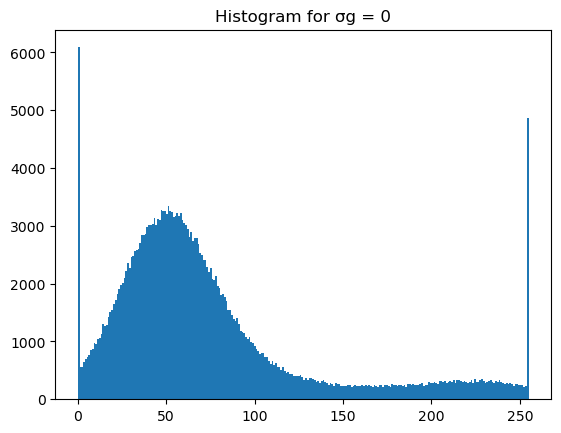

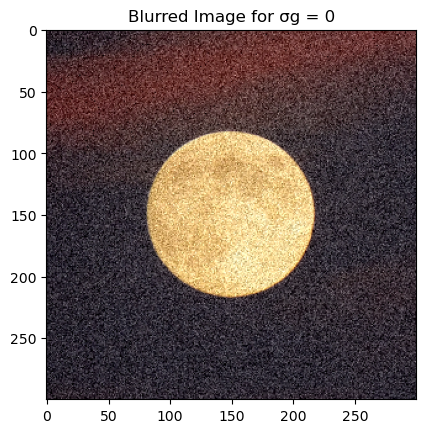

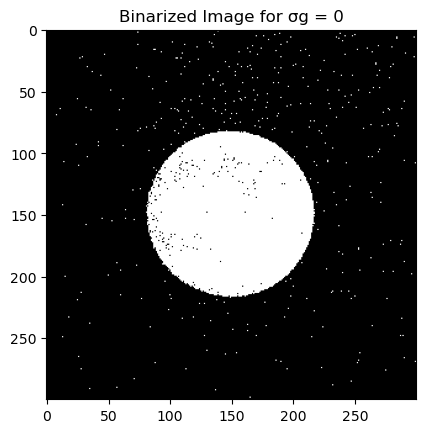

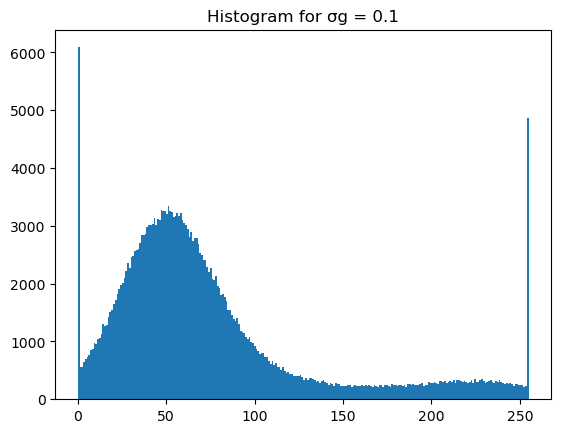

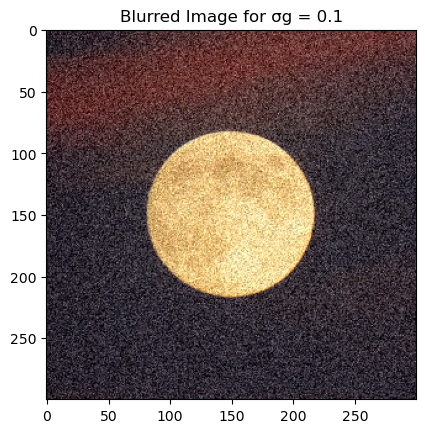

...

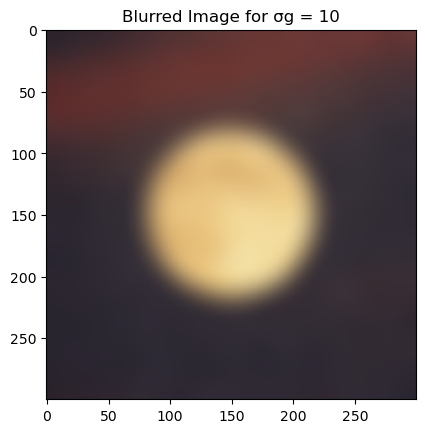

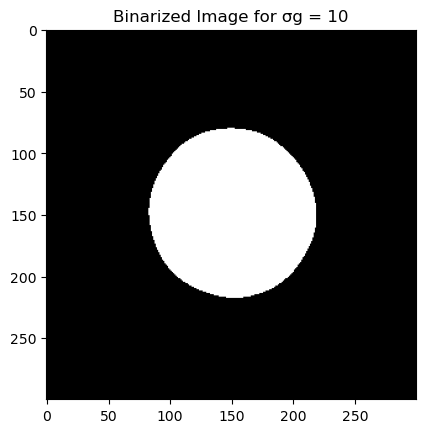

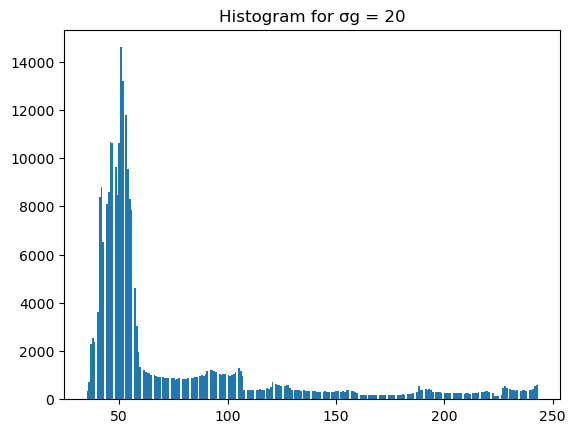

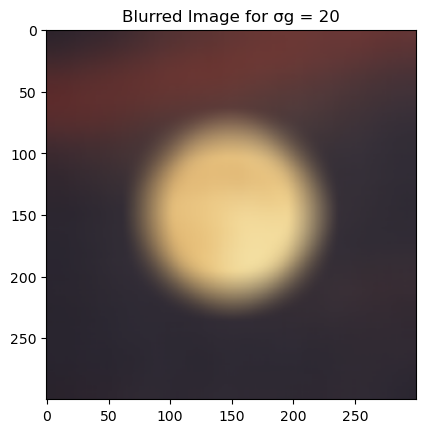

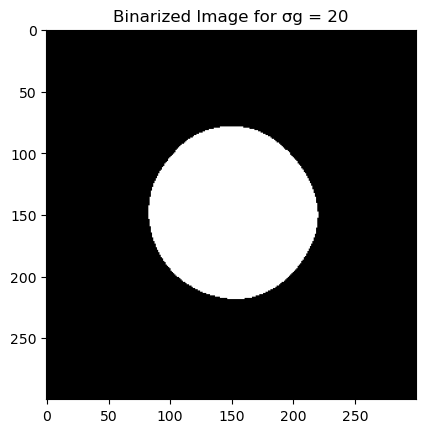

Within-class variance for σg = 0: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Within-class variance for σg = 0.1: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Within-class variance for σg = 0.5: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Within-class variance for σg = 1: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Within-class variance for σg = 2.5: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Within-class variance for σg = 5: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Within-class variance for σg = 10: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

def gaussian_filter(size, sigma_g):
    ax = np.linspace(-(size // 2), size // 2, size)
    x, y = np.meshgrid(ax, ax)
    gaussian = np.exp(-(x**2 + y**2) / (2 * sigma_g**2))
    return gaussian / np.sum(gaussian) 

def apply_gaussian_blur(image, sigma_g):
    if sigma_g == 0:
        blurred_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return blurred_image
    kernel = gaussian_filter(41, sigma_g)
    blurred_image = image.copy()
    r = convolve(blurred_image[:, :, 0], kernel)
    g = convolve(blurred_image[:, :, 1], kernel)
    b = convolve(blurred_image[:, :, 2], kernel)
    blurred_image[:, :, 0] = b
    blurred_image[:, :, 1] = g
    blurred_image[:, :, 2] = r
    return blurred_image

def apply_otsu_binarization(image):
    _, binarized_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return binarized_image

def plot_histogram(image, sigma_g):
    plt.hist(image.ravel(), bins=256)
    plt.title(f"Histogram for σg = {sigma_g}")
    plt.show()

def plot_blurred_image(image, sigma_g):
    plt.imshow(image)
    plt.title(f"Blurred Image for σg = {sigma_g}")
    plt.show()

def plot_binarized_image(image, sigma_g):
    plt.imshow(image, cmap='gray')
    plt.title(f"Binarized Image for σg = {sigma_g}")
    plt.show()


sigmas = [0, 0.1, 0.5, 1, 2.5, 5, 10, 20]
within_class_variances = []

image = cv2.imread('moon_noisy.png')

for i in range(len(sigmas)):
    blurred_image = apply_gaussian_blur(image, sigmas[i])
    blurred_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)

    binarized_image = apply_otsu_binarization(blurred_image_gray)
    _, variance = cv2.threshold(blurred_image_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    within_class_variances.append(variance)

    plot_histogram(blurred_image, sigmas[i])
    plot_blurred_image(blurred_image, sigmas[i])
    plot_binarized_image(binarized_image, sigmas[i])
#print(within_class_variances)
for i in range(len(within_class_variances)):
    print(f"Within-class variance for σg = {sigmas[i]}: {within_class_variances[i]}")
 


optimal_sigma_g = sigmas[np.argmin(within_class_variances)]
print(f"Optimal σg that minimizes within-class variance: {optimal_sigma_g}")

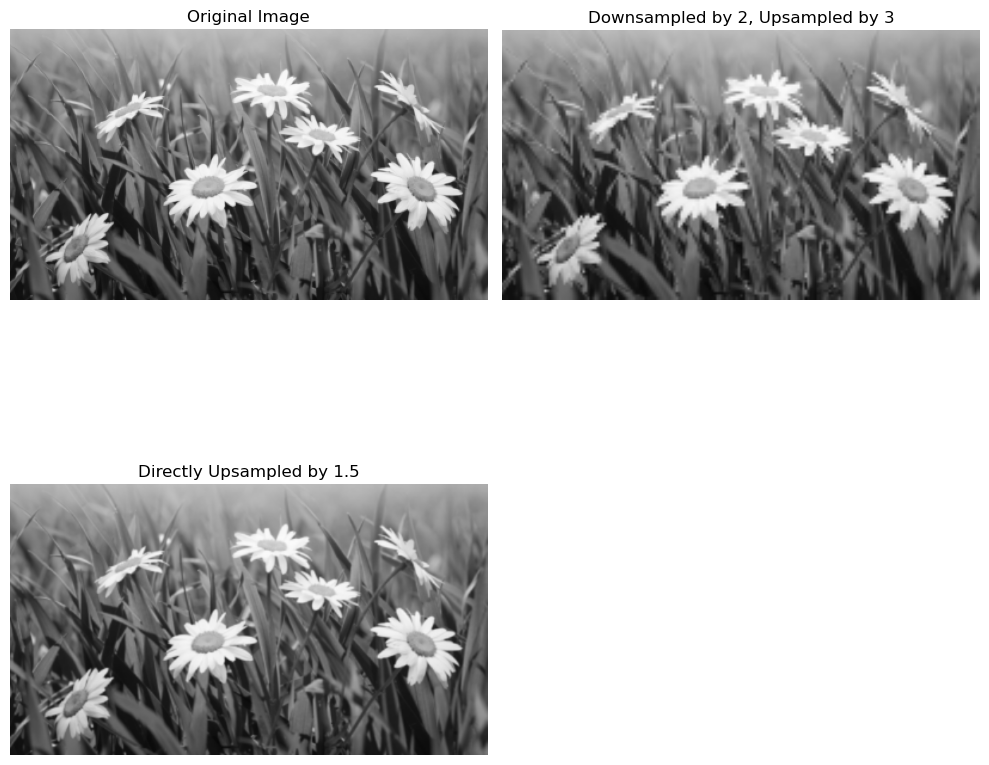

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Bilinear interpolation helper function
def bilinear_interpolate(image, x, y):
    # Define the neighboring points for interpolation
    x0 = int(np.floor(x))
    x1 = min(x0 + 1, image.shape[1] - 1)
    y0 = int(np.floor(y))
    y1 = min(y0 + 1, image.shape[0] - 1)

    # Four surrounding pixels
    Ia = image[y0, x0]
    Ib = image[y1, x0]
    Ic = image[y0, x1]
    Id = image[y1, x1]

    # Handle cases where division by zero might occur (when x0 == x1 or y0 == y1)
    if x0 == x1:
        fx_y0 = Ia  # No interpolation along x if x0 == x1
        fx_y1 = Ib  # No interpolation along x if x0 == x1
    else:
        # Perform Lagrange interpolation along x for y0 and y1
        fx_y0 = (x1 - x) / (x1 - x0) * Ia + (x - x0) / (x1 - x0) * Ic
        fx_y1 = (x1 - x) / (x1 - x0) * Ib + (x - x0) / (x1 - x0) * Id

    if y0 == y1:
        return fx_y0  # No interpolation along y if y0 == y1
    else:
        # Perform Lagrange interpolation along y
        return (y1 - y) / (y1 - y0) * fx_y0 + (y - y0) / (y1 - y0) * fx_y1

# Function for downsampling by a factor
def downsample(image, factor):
    height, width, channels = image.shape
    new_height = height // factor
    new_width = width // factor
    downsampled = np.zeros((new_height, new_width, channels), dtype=np.uint8)

    for i in range(new_height):
        for j in range(new_width):
            # Map coordinates from new to old image
            old_i = i * factor
            old_j = j * factor
            downsampled[i, j] = image[old_i, old_j]  # Simply take the nearest pixel for downsampling

    return downsampled

# Function for upsampling by a factor using bilinear interpolation
def upsample(image, factor):
    height, width, channels = image.shape
    new_height = int(height * factor)
    new_width = int(width * factor)
    upsampled = np.zeros((new_height, new_width, channels), dtype=np.uint8)

    for i in range(new_height):
        for j in range(new_width):
            # Map coordinates from new image to old image
            old_x = j / factor
            old_y = i / factor
            for c in range(channels):
                upsampled[i, j, c] = bilinear_interpolate(image[:, :, c], old_x, old_y)

    return upsampled

# Load the image
image = cv2.imread('flowers.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# (a) Downsample by 2 and upsample by 3
downsampled = downsample(image_rgb, 2)
upsampled_after_downsampling = upsample(downsampled, 3)

# (b) Directly upsample by 1.5
upsampled_direct = upsample(image_rgb, 1.5)  # Corrected to upsample by 1.5

# Visualize the results
plt.figure(figsize=(10, 10))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# Downsampled and then upsampled image
plt.subplot(2, 2, 2)
plt.imshow(upsampled_after_downsampling)
plt.title('Downsampled by 2, Upsampled by 3')
plt.axis('off')

# Directly upsampled image
plt.subplot(2, 2, 3)
plt.imshow(upsampled_direct)
plt.title('Directly Upsampled by 1.5')
plt.axis('off')

plt.tight_layout()
plt.show()


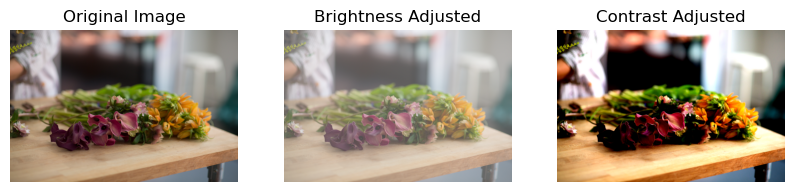

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def brightnessAdjust(img, p):
    """
    Adjusts the brightness of an image based on the parameter p.
    p=0 gives a black image, p=1 gives the original image, p=0.5 gives no adjustment.
    
    Args:
    - img: Input image as a NumPy array.
    - p: Brightness control parameter (0 to 1).
    
    Returns:
    - Adjusted image.
    """
    # Ensure the input parameter p is within [0, 1]
    p = np.clip(p, 0, 1)
    
    # Scale the image based on the brightness parameter

    if p <= 0.5:
        
        adjusted_img = img * 2*p  # Simple linear interpolation
        print(p)

    elif p > 0.5:

        adjusted_img = img + (255-img)*(2*p-1)
    
    # Clip the values to stay within [0, 255] range
    adjusted_img = np.clip(adjusted_img, 0, 255).astype(np.uint8)
    
    return adjusted_img

def contrastAdjust(img, p):
    """
    Adjusts the contrast of an image based on the parameter p.
    p=0 gives a grey image, p=0.5 gives no adjustment, p=1 increases the contrast.
    
    Args:
    - img: Input image as a NumPy array.
    - p: Contrast control parameter (0 to 1).
    
    Returns:
    - Adjusted image.
    """
    # Ensure the input parameter p is within [0, 1]
    p = np.clip(p, 0, 1)
    
    # Define the midpoint for contrast adjustment (128 for 8-bit images)
    midpoint = 128.0
    
    # Slope for contrast adjustment, varies depending on p
    if p > 0.5:
        slope = 1 + 2 * (p - 0.5)  # Slope > 1 for p > 0.5 (increases contrast)
    else:
        slope = 1 - 2 * (0.5 - p)  # Slope < 1 for p < 0.5 (decreases contrast)
    
    # Adjust contrast: shift intensities towards or away from midpoint
    adjusted_img = midpoint + (img - midpoint) * slope
    
    # Clip the values to stay within [0, 255] range
    adjusted_img = np.clip(adjusted_img, 0, 255).astype(np.uint8)
    
    return adjusted_img

# Example usage:

# Load the image (you can replace 'brightness_contrast.jpg' with the actual image path)
img = cv2.imread('brightness_contrast.jpg')

# Convert the image from BGR to RGB for matplotlib display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply brightness adjustment
p_brightness = 0.66 # Example value for brightness
bright_img = brightnessAdjust(img_rgb, p_brightness)

# Apply contrast adjustment
p_contrast = 1  # Example value for contrast
contrast_img = contrastAdjust(img_rgb, p_contrast)

# Display results using matplotlib
plt.figure(figsize=(10, 5))

# Display original image
plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')

# Display brightness adjusted image
plt.subplot(1, 3, 2)
#plt.imshow(cv2.cvtColor(bright_img, cv2.COLOR_BGR2GRAY), cmap = 'gray')
plt.imshow(bright_img)
plt.title('Brightness Adjusted')
plt.axis('off')

# Display contrast adjusted image
plt.subplot(1, 3, 3)
plt.imshow(contrast_img,cmap='gray')
plt.title('Contrast Adjusted')
plt.axis('off')

# Show the images
plt.show()


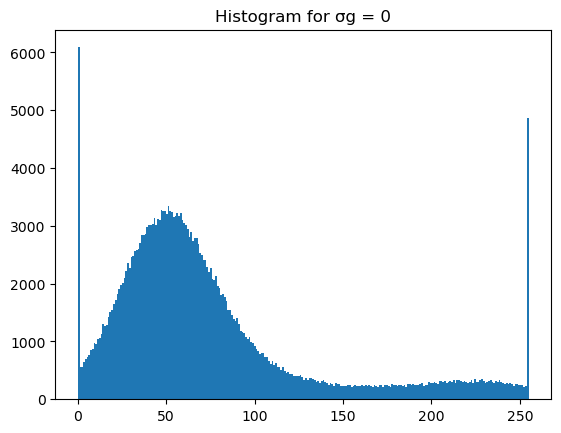

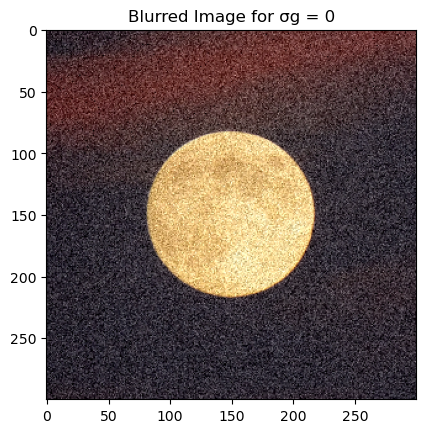

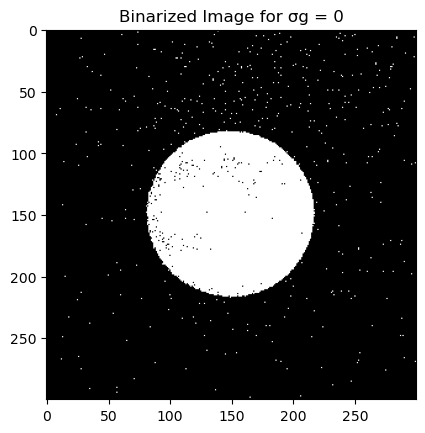

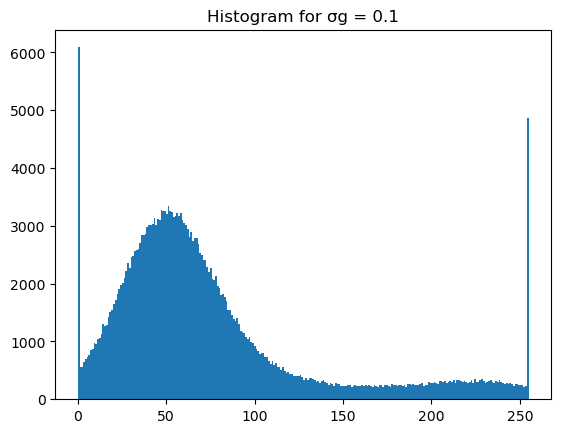

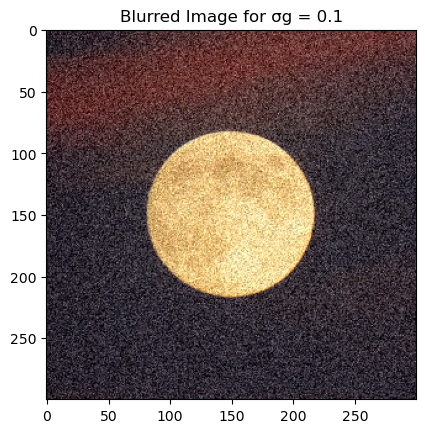

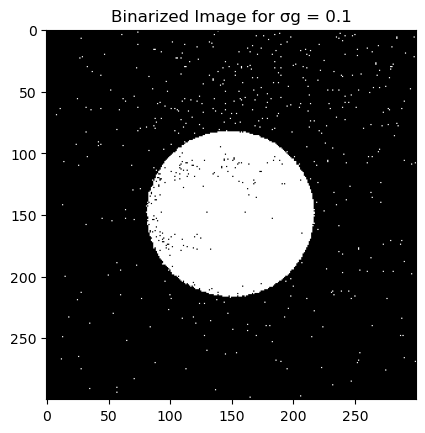

C:\Users\New Fly High\AppData\Local\Temp\ipykernel_18992\1288030693.py:41: RuntimeWarning: invalid value encountered in divide
  cum_u0 = cum_means / sum_w0


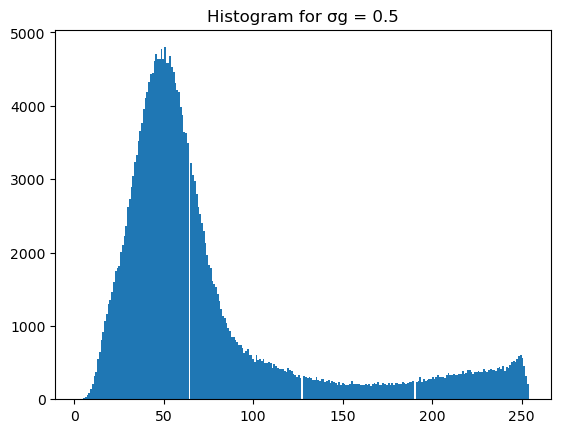

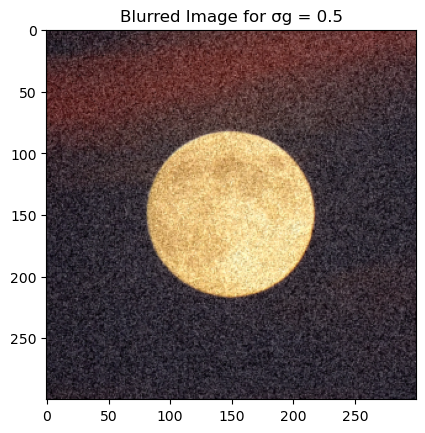

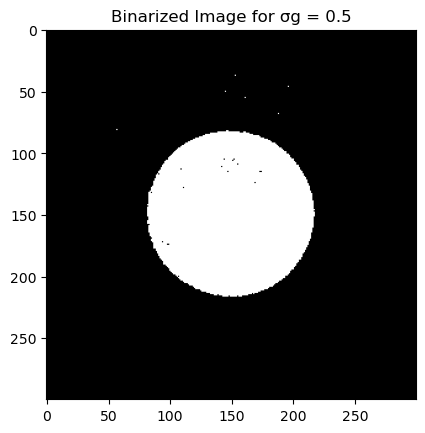

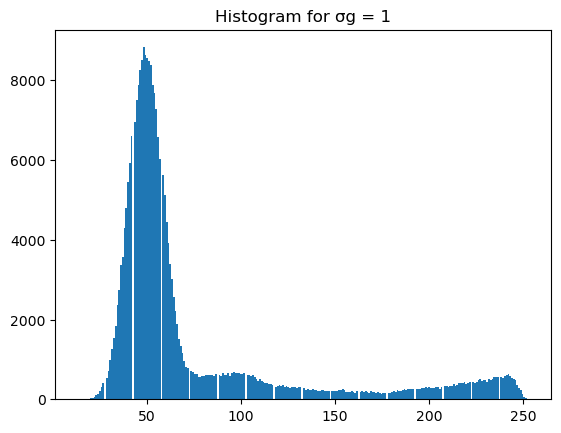

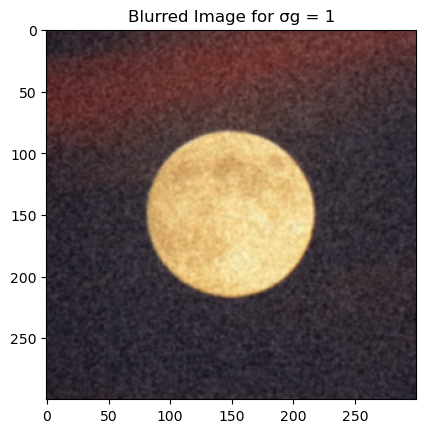

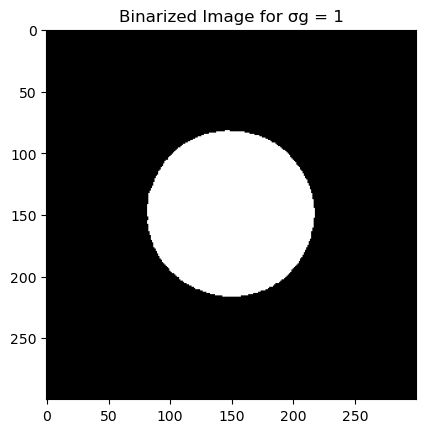

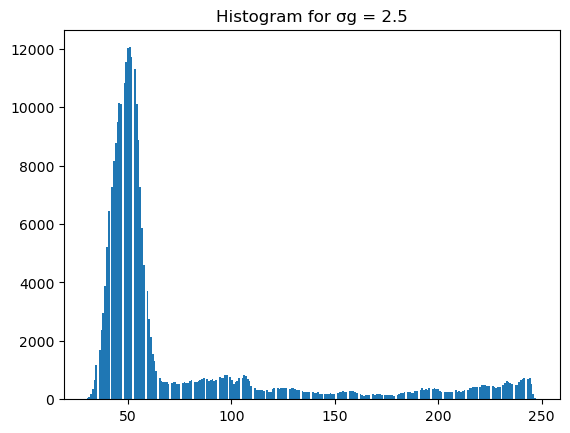

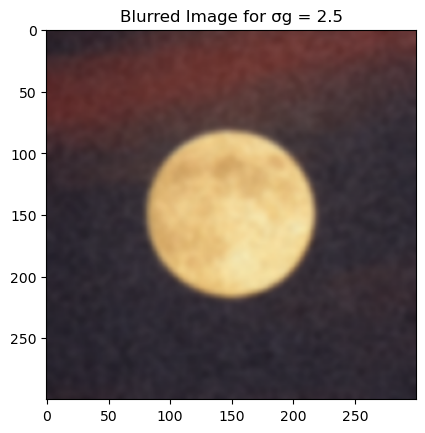

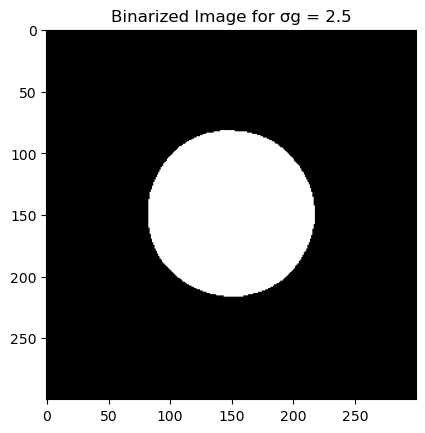

C:\Users\New Fly High\AppData\Local\Temp\ipykernel_18992\1288030693.py:42: RuntimeWarning: invalid value encountered in divide
  cum_u1 = (u_t - cum_means) / sum_w1


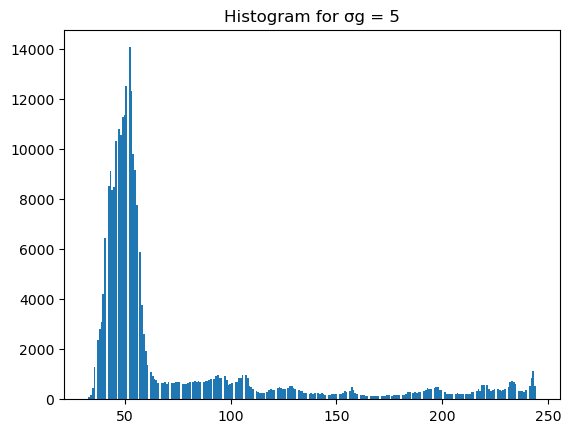

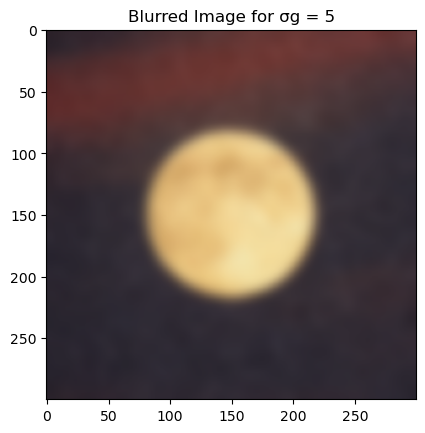

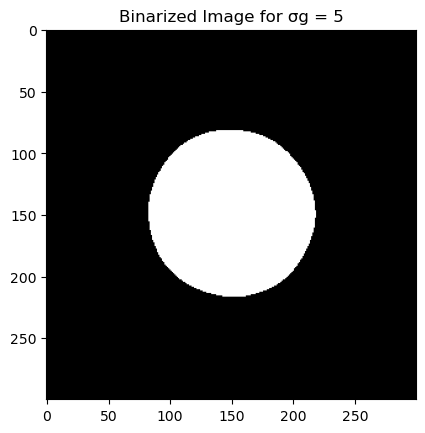

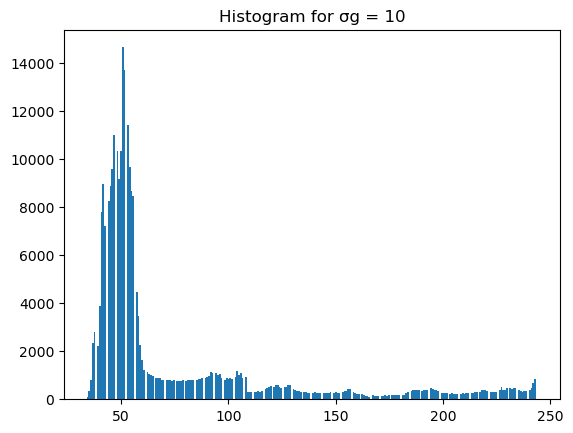

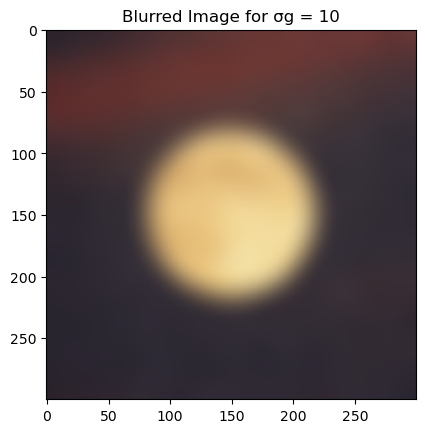

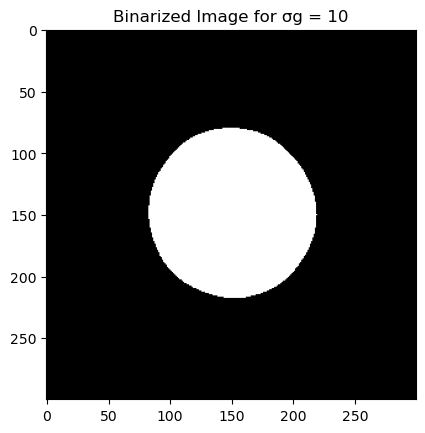

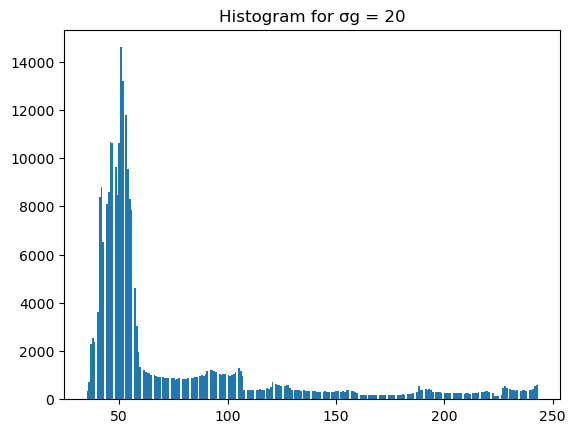

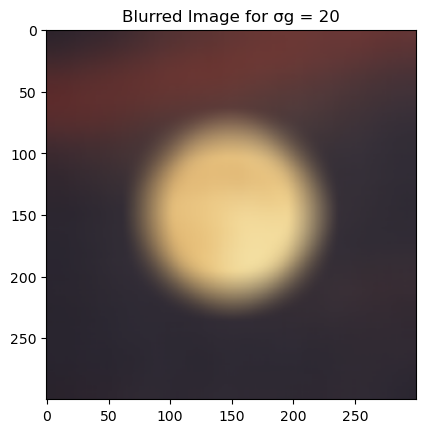

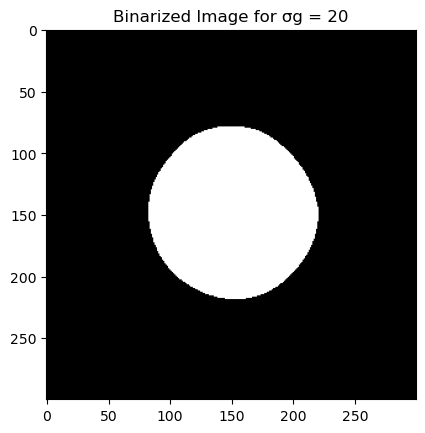

Optimal σg that minimizes within-class variance: 20


In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

def gaussian_filter(size, sigma_g):
    ax = np.linspace(-(size // 2), size // 2, size)
    x, y = np.meshgrid(ax, ax)
    gaussian = np.exp(-(x**2 + y**2) / (2 * sigma_g**2))
    return gaussian / np.sum(gaussian) 

def apply_gaussian_blur(image, sigma_g):
    if sigma_g == 0:
        blurred_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return blurred_image
    kernel = gaussian_filter(41, sigma_g)
    blurred_image = image.copy()
    r = convolve(blurred_image[:, :, 0], kernel)
    g = convolve(blurred_image[:, :, 1], kernel)
    b = convolve(blurred_image[:, :, 2], kernel)
    blurred_image[:, :, 0] = b
    blurred_image[:, :, 1] = g
    blurred_image[:, :, 2] = r
    return blurred_image

# Replace cv2's Otsu binarization with the custom function
def otsu_threshold(image):
    """Apply Otsu's thresholding to an image block."""
    hist, _ = np.histogram(image.ravel(), bins=256, range=(0, 256))
    hist_nor = hist / hist.sum()

    pixel_values = np.arange(256)
    best_sig = float('inf')
    best_thresh = 0

    sum_w0 = np.cumsum(hist_nor)
    sum_w1 = 1 - sum_w0

    cum_means = np.cumsum(pixel_values * hist_nor)
    u_t = cum_means[-1]
    cum_u0 = cum_means / sum_w0
    cum_u1 = (u_t - cum_means) / sum_w1

    valid = (sum_w0 > 0) & (sum_w1 > 0)

    sig_b = np.zeros(256)
    sig_b[valid] = sum_w0[valid] * sum_w1[valid] * ((cum_u0[valid] - cum_u1[valid]) ** 2)

    best_thresh = np.argmax(sig_b)

    return best_thresh

# Update the apply_otsu_binarization to use custom Otsu function
def apply_otsu_binarization(image):
    best_thresh = otsu_threshold(image)
    binarized_image = (image >= best_thresh).astype(np.uint8) * 255
    return binarized_image

def plot_histogram(image, sigma_g):
    plt.hist(image.ravel(), bins=256)
    plt.title(f"Histogram for σg = {sigma_g}")
    plt.show()

def plot_blurred_image(image, sigma_g):
    plt.imshow(image)
    plt.title(f"Blurred Image for σg = {sigma_g}")
    plt.show()

def plot_binarized_image(image, sigma_g):
    plt.imshow(image, cmap='gray')
    plt.title(f"Binarized Image for σg = {sigma_g}")
    plt.show()

sigmas = [0, 0.1, 0.5, 1, 2.5, 5, 10, 20]
within_class_variances = []

image = cv2.imread('moon_noisy.png')

for i in range(len(sigmas)):
    blurred_image = apply_gaussian_blur(image, sigmas[i])
    blurred_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)

    binarized_image = apply_otsu_binarization(blurred_image_gray)
    best_thresh = otsu_threshold(blurred_image_gray)  # Replaces OpenCV Otsu call
    within_class_variances.append(best_thresh)  # Track thresholds instead of variance
    plot_histogram(blurred_image, sigmas[i])
    plot_blurred_image(blurred_image, sigmas[i])
    plot_binarized_image(binarized_image, sigmas[i])

optimal_sigma_g = sigmas[np.argmin(within_class_variances)]
print(f"Optimal σg that minimizes within-class variance: {optimal_sigma_g}")


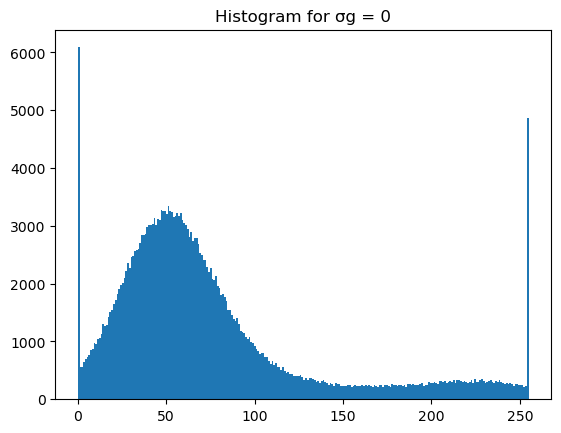

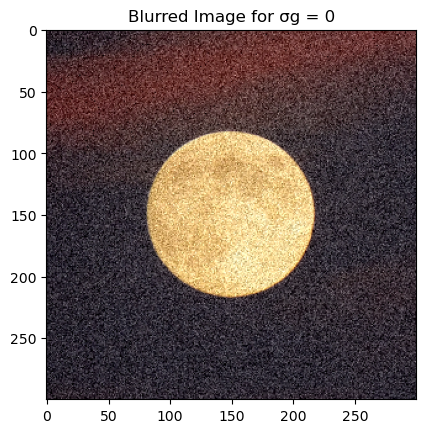

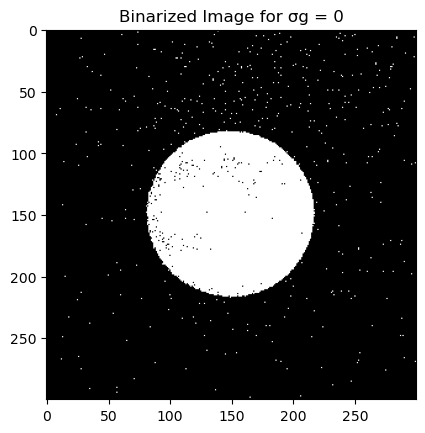

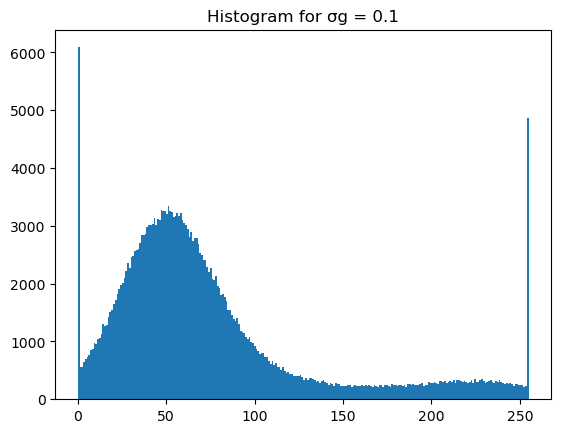

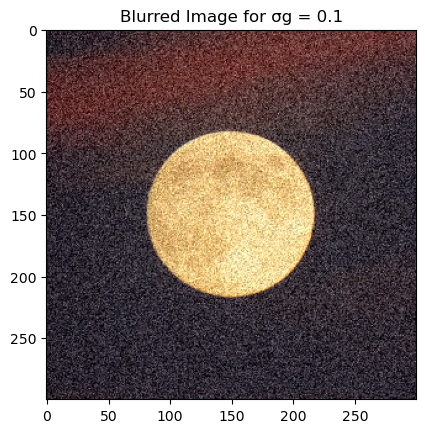

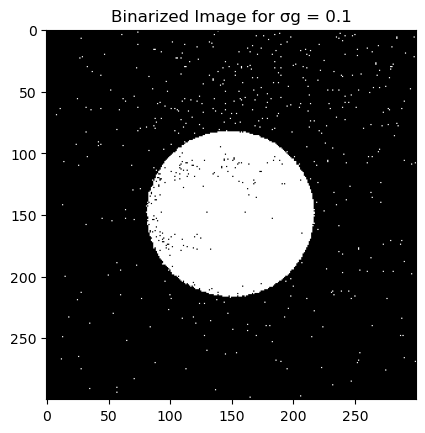

C:\Users\New Fly High\AppData\Local\Temp\ipykernel_18992\1828036018.py:41: RuntimeWarning: invalid value encountered in divide
  cum_u0 = cum_means / sum_w0


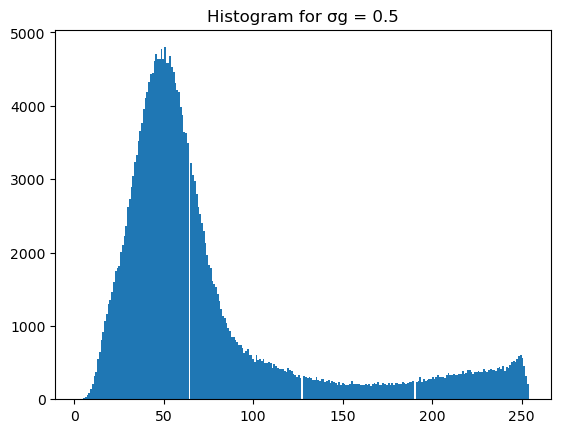

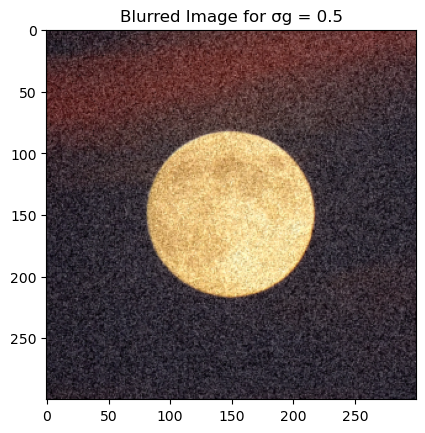

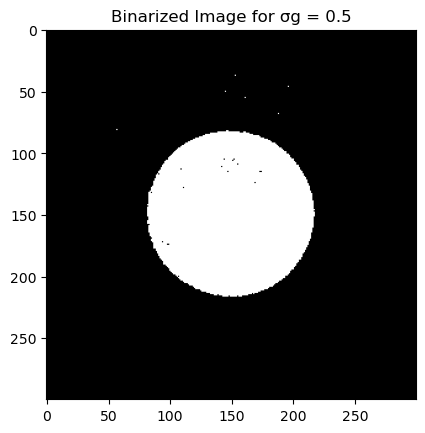

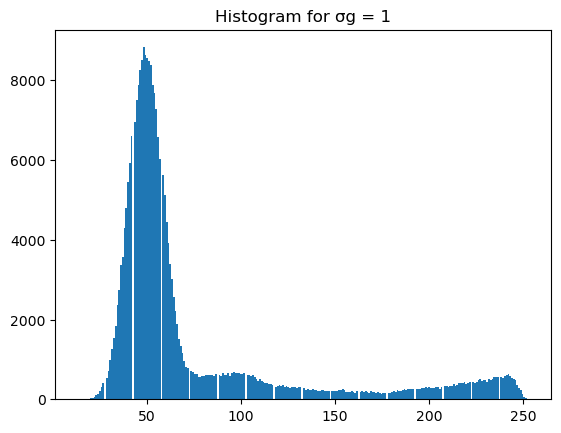

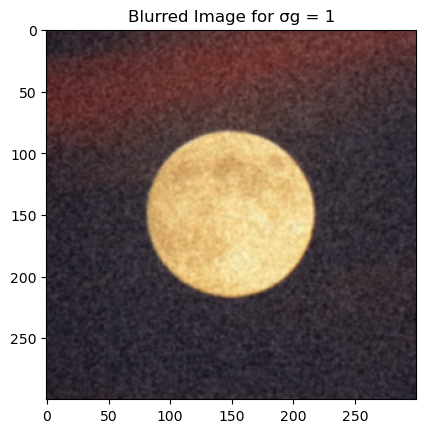

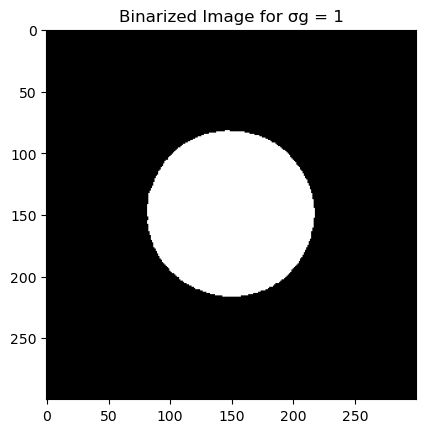

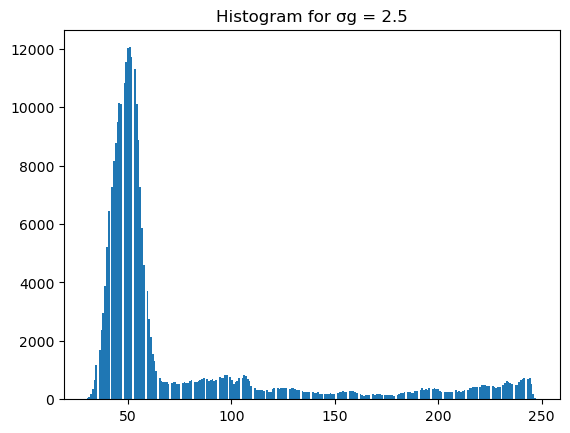

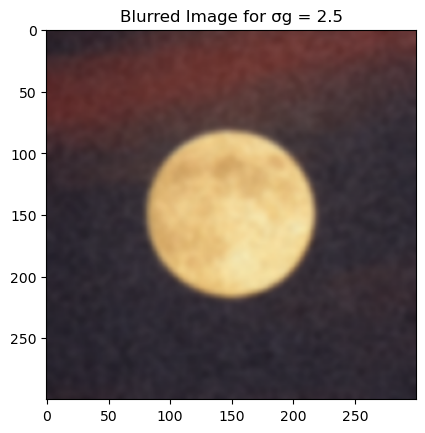

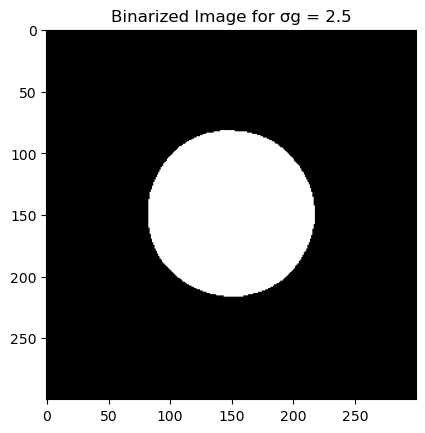

C:\Users\New Fly High\AppData\Local\Temp\ipykernel_18992\1828036018.py:42: RuntimeWarning: invalid value encountered in divide
  cum_u1 = (u_t - cum_means) / sum_w1


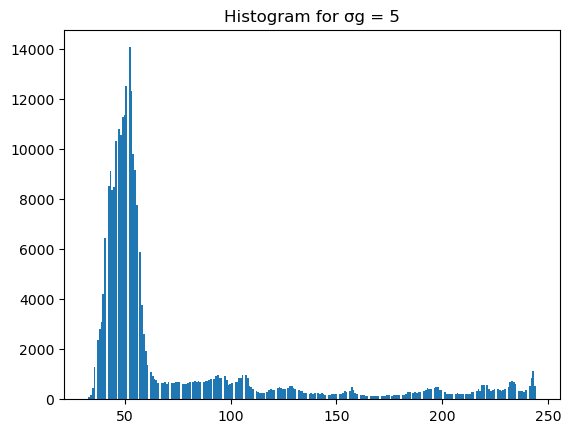

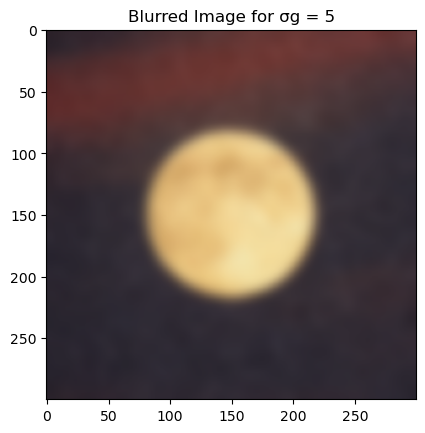

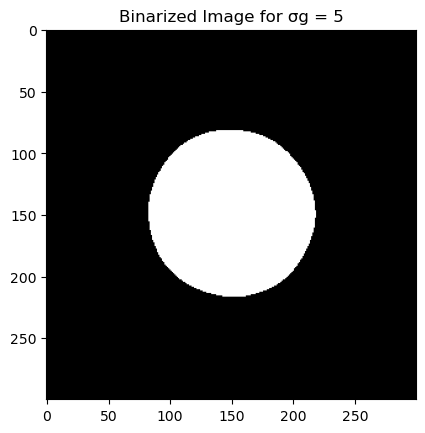

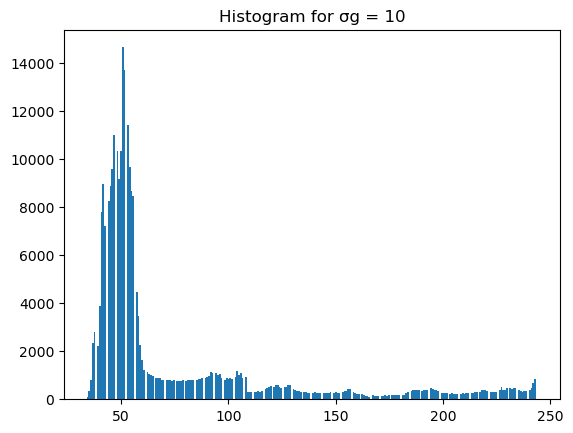

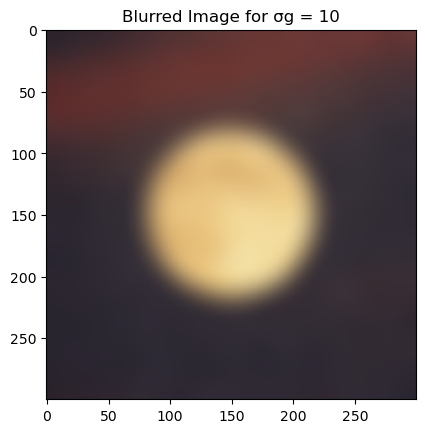

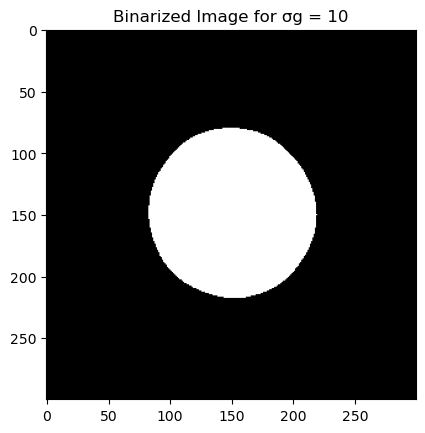

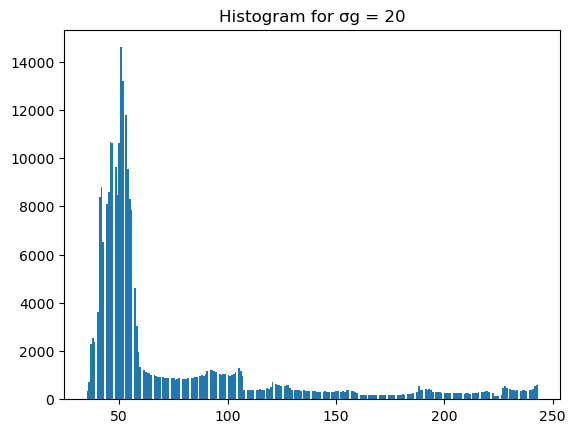

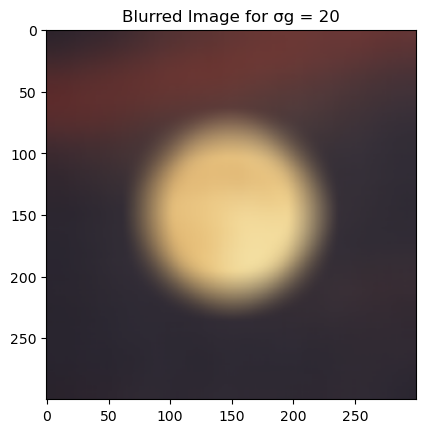

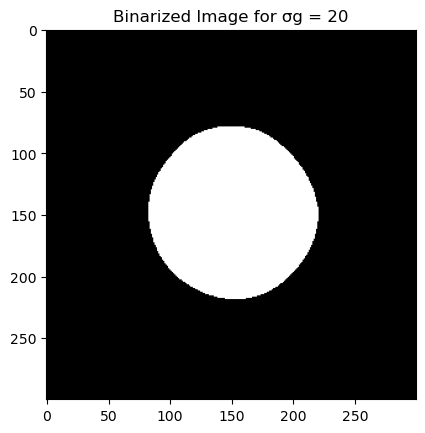

Optimal σg that minimizes within-class variance: 2.5


In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

def gaussian_filter(size, sigma_g):
    """Create a Gaussian filter based on the given size and sigma."""
    ax = np.linspace(-(size // 2), size // 2, size)
    x, y = np.meshgrid(ax, ax)
    gaussian = np.exp(-(x**2 + y**2) / (2 * sigma_g**2))
    return gaussian / np.sum(gaussian) 

def apply_gaussian_blur(image, sigma_g):
    """Apply Gaussian blur to the image using the given sigma."""
    if sigma_g == 0:
        blurred_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return blurred_image
    kernel = gaussian_filter(41, sigma_g)
    blurred_image = image.copy()
    r = convolve(blurred_image[:, :, 0], kernel)
    g = convolve(blurred_image[:, :, 1], kernel)
    b = convolve(blurred_image[:, :, 2], kernel)
    blurred_image[:, :, 0] = b
    blurred_image[:, :, 1] = g
    blurred_image[:, :, 2] = r
    return blurred_image

def otsu_threshold(image):
    """Calculate the optimal Otsu's threshold and the corresponding within-class variance."""
    hist, _ = np.histogram(image.ravel(), bins=256, range=(0, 256))
    hist_nor = hist / hist.sum()

    pixel_values = np.arange(256)

    sum_w0 = np.cumsum(hist_nor)
    sum_w1 = 1 - sum_w0

    cum_means = np.cumsum(pixel_values * hist_nor)
    u_t = cum_means[-1]  # Total mean

    cum_u0 = cum_means / sum_w0
    cum_u1 = (u_t - cum_means) / sum_w1

    valid = (sum_w0 > 0) & (sum_w1 > 0)

    sig_b = np.zeros(256)
    sig_b[valid] = sum_w0[valid] * sum_w1[valid] * ((cum_u0[valid] - cum_u1[valid]) ** 2)

    best_thresh = np.argmax(sig_b)
    
    within_class_variance = np.min(sig_b[valid])  # The minimum within-class variance
    
    return best_thresh, within_class_variance

def apply_otsu_binarization(image):
    """Binarize the image using Otsu's method."""
    best_thresh, _ = otsu_threshold(image)
    binarized_image = (image >= best_thresh).astype(np.uint8) * 255
    return binarized_image

def plot_histogram(image, sigma_g):
    plt.hist(image.ravel(), bins=256)
    plt.title(f"Histogram for σg = {sigma_g}")
    plt.show()

def plot_blurred_image(image, sigma_g):
    plt.imshow(image)
    plt.title(f"Blurred Image for σg = {sigma_g}")
    plt.show()

def plot_binarized_image(image, sigma_g):
    plt.imshow(image, cmap='gray')
    plt.title(f"Binarized Image for σg = {sigma_g}")
    plt.show()

# Define sigma values to evaluate
sigmas = [0, 0.1, 0.5, 1, 2.5, 5, 10, 20]
within_class_variances = []

# Load the image
image = cv2.imread('moon_noisy.png')

for i in range(len(sigmas)):
    # Apply Gaussian blur
    blurred_image = apply_gaussian_blur(image, sigmas[i])
    
    # Convert to grayscale
    blurred_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)

    # Apply custom Otsu binarization and calculate within-class variance
    binarized_image = apply_otsu_binarization(blurred_image_gray)
    _, within_class_variance = otsu_threshold(blurred_image_gray)  # Track within-class variance
    
    within_class_variances.append(within_class_variance)
    
    # Plot histograms, blurred, and binarized images
    plot_histogram(blurred_image, sigmas[i])
    plot_blurred_image(blurred_image, sigmas[i])
    plot_binarized_image(binarized_image, sigmas[i])

# Find the sigma that minimizes the within-class variance
optimal_sigma_g = sigmas[np.argmin(within_class_variances)]
print(f"Optimal σg that minimizes within-class variance: {optimal_sigma_g}")


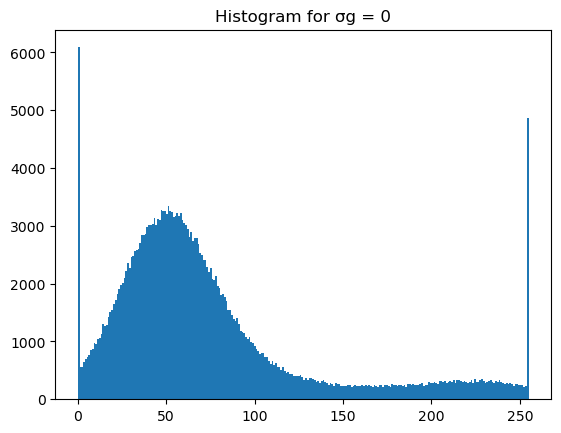

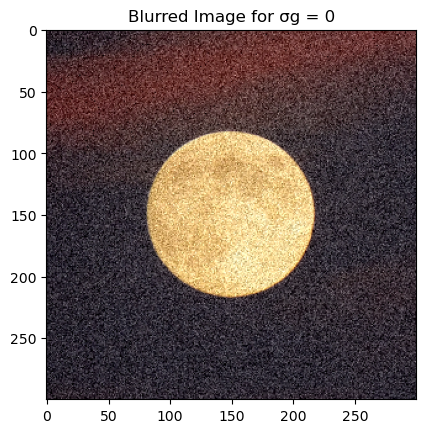

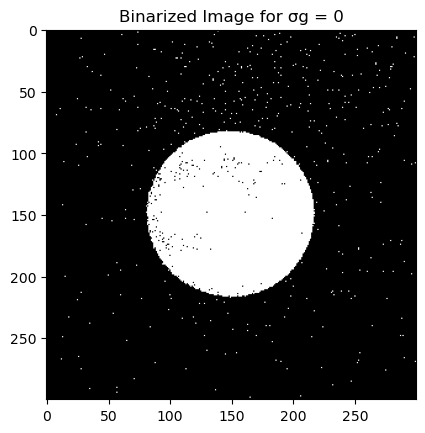

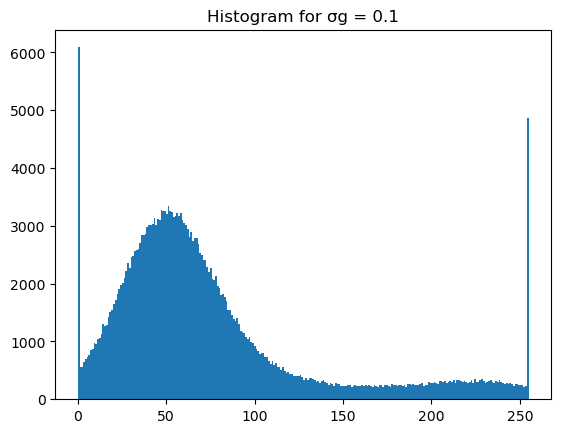

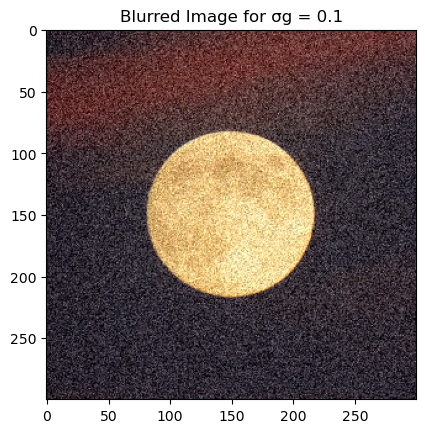

...

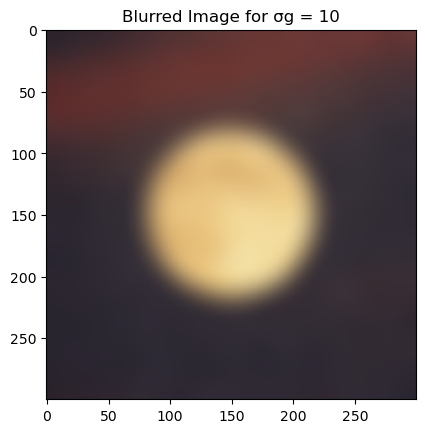

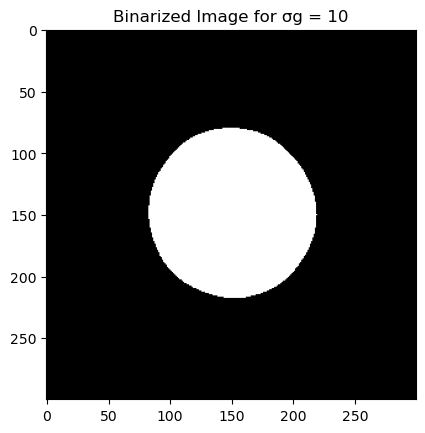

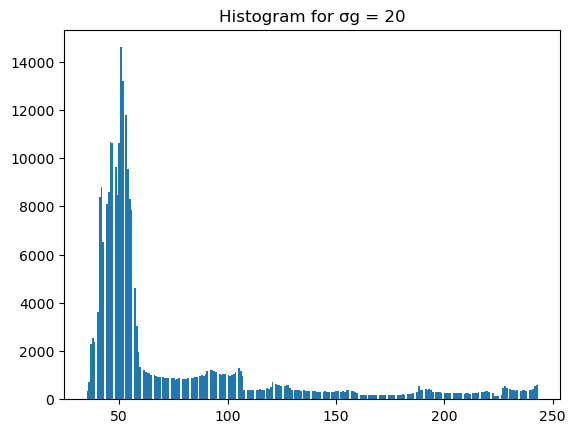

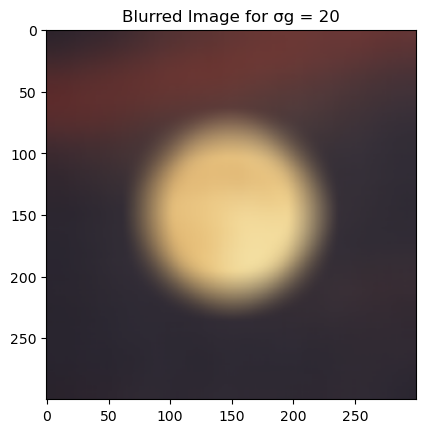

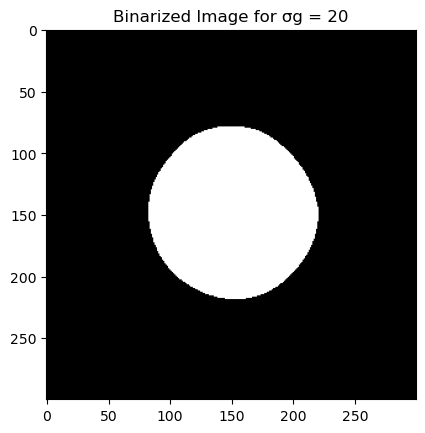

[117, 117, 117, 116, 115, 114, 111, 109]
[0.3689802541353065, 0.3689802541353065, 1.1277081827103878e-12, 7.329435778267018e-12, 1.1273962940726456e-12, 0.9949619062385702, 0.49579165425401933, 2.255318608828322e-12]
Within-class variance for σg = 0: 0.3689802541353065
Within-class variance for σg = 0.1: 0.3689802541353065
Within-class variance for σg = 0.5: 1.1277081827103878e-12
Within-class variance for σg = 1: 7.329435778267018e-12
Within-class variance for σg = 2.5: 1.1273962940726456e-12
Within-class variance for σg = 5: 0.9949619062385702
Within-class variance for σg = 10: 0.49579165425401933
Within-class variance for σg = 20: 2.255318608828322e-12
Optimal σg that minimizes within-class variance: 2.5


In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

def gaussian_filter(size, sigma_g):
    """Create a Gaussian filter based on the given size and sigma."""
    ax = np.linspace(-(size // 2), size // 2, size)
    x, y = np.meshgrid(ax, ax)
    gaussian = np.exp(-(x**2 + y**2) / (2 * sigma_g**2))
    return gaussian / np.sum(gaussian) 

def apply_gaussian_blur(image, sigma_g):
    """Apply Gaussian blur to the image using the given sigma."""
    if sigma_g == 0:
        blurred_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return blurred_image
    kernel = gaussian_filter(41, sigma_g)
    blurred_image = image.copy()
    r = convolve(blurred_image[:, :, 0], kernel)
    g = convolve(blurred_image[:, :, 1], kernel)
    b = convolve(blurred_image[:, :, 2], kernel)
    blurred_image[:, :, 0] = b
    blurred_image[:, :, 1] = g
    blurred_image[:, :, 2] = r
    return blurred_image

def otsu_threshold(image):
    """Calculate the optimal Otsu's threshold and the corresponding within-class variance."""
    hist, _ = np.histogram(image.ravel(), bins=256, range=(0, 256))
    hist_nor = hist / hist.sum()

    pixel_values = np.arange(256)

    sum_w0 = np.cumsum(hist_nor)
    sum_w1 = 1 - sum_w0

    cum_means = np.cumsum(pixel_values * hist_nor)
    u_t = cum_means[-1]  # Total mean

    with np.errstate(divide='ignore', invalid='ignore'):
        cum_u0 = cum_means / sum_w0
        cum_u1 = (u_t - cum_means) / sum_w1

    # Avoid invalid values (NaNs) caused by division by zero
    valid = (sum_w0 > 0) & (sum_w1 > 0)

    sig_b = np.zeros(256)
    sig_b[valid] = sum_w0[valid] * sum_w1[valid] * ((cum_u0[valid] - cum_u1[valid]) ** 2)

    best_thresh = np.argmax(sig_b)
    
    within_class_variance = np.min(sig_b[valid])  # The minimum within-class variance
    
    return best_thresh, within_class_variance

def apply_otsu_binarization(image):
    """Binarize the image using Otsu's method."""
    best_thresh, _ = otsu_threshold(image)
    binarized_image = (image >= best_thresh).astype(np.uint8) * 255
    return binarized_image

def plot_histogram(image, sigma_g):
    plt.hist(image.ravel(), bins=256)
    plt.title(f"Histogram for σg = {sigma_g}")
    plt.show()

def plot_blurred_image(image, sigma_g):
    plt.imshow(image)
    plt.title(f"Blurred Image for σg = {sigma_g}")
    plt.show()

def plot_binarized_image(image, sigma_g):
    plt.imshow(image, cmap='gray')
    plt.title(f"Binarized Image for σg = {sigma_g}")
    plt.show()

# Define sigma values to evaluate
sigmas = [0, 0.1, 0.5, 1, 2.5, 5, 10, 20]
within_class_variances = []
thres=[]
# Load the image
image = cv2.imread('moon_noisy.png')

for i in range(len(sigmas)):
    # Apply Gaussian blur
    blurred_image = apply_gaussian_blur(image, sigmas[i])
    
    # Convert to grayscale
    blurred_image_gray = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)

    # Apply custom Otsu binarization and calculate within-class variance
    binarized_image = apply_otsu_binarization(blurred_image_gray)
    thre, within_class_variance = otsu_threshold(blurred_image_gray)  # Track within-class variance
    
    within_class_variances.append(within_class_variance)
    thres.append(thre)
    # Plot histograms, blurred, and binarized images
    plot_histogram(blurred_image, sigmas[i])
    plot_blurred_image(blurred_image, sigmas[i])
    plot_binarized_image(binarized_image, sigmas[i])
print(thres)
print(within_class_variances)
for i in range(len(within_class_variances)):
    print(f"Within-class variance for σg = {sigmas[i]}: {within_class_variances[i]}")
# Find the sigma that minimizes the within-class variance
optimal_sigma_g = sigmas[np.argmin(within_class_variances)]
print(f"Optimal σg that minimizes within-class variance: {optimal_sigma_g}")


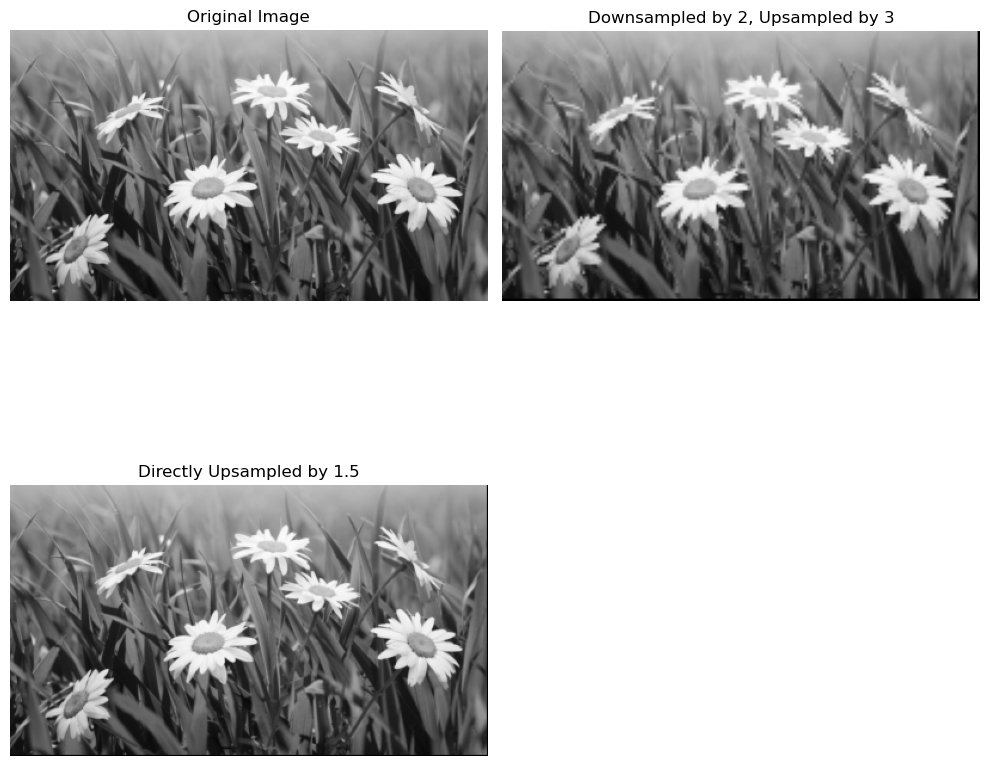

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Bilinear interpolation helper function
def bilinear_interpolate(image, x, y):
    x0 = int(np.floor(x))
    x1 = min(x0 + 1, image.shape[1] - 1)
    y0 = int(np.floor(y))
    y1 = min(y0 + 1, image.shape[0] - 1)

    Ia = image[y0, x0]
    Ib = image[y1, x0]
    Ic = image[y0, x1]
    Id = image[y1, x1]

    wa = (x1 - x) * (y1 - y)
    wb = (x1 - x) * (y - y0)
    wc = (x - x0) * (y1 - y)
    wd = (x - x0) * (y - y0)


    return wa * Ia + wb * Ib + wc * Ic + wd * Id

# Function for downsampling by a factor
def downsample(image, factor):
    height, width, channels = image.shape
    new_height = height // factor
    new_width = width // factor
    downsampled = np.zeros((new_height, new_width, channels), dtype=np.uint8)

    for i in range(new_height):
        for j in range(new_width):
            # Map coordinates from new to old image
            old_i = i * factor
            old_j = j * factor
            downsampled[i, j] = image[old_i, old_j]  # Simply take the nearest pixel for downsampling

    return downsampled

# Function for upsampling by a factor using bilinear interpolation
def upsample(image, factor):
    height, width, channels = image.shape
    new_height = int(height * factor)
    new_width = int(width * factor)
    upsampled = np.zeros((new_height, new_width, channels), dtype=np.uint8)

    for i in range(new_height):
        for j in range(new_width):
            # Map coordinates from new image to old image
            old_x = j / factor
            old_y = i / factor
            for c in range(channels):
                upsampled[i, j, c] = bilinear_interpolate(image[:, :, c], old_x, old_y)

    return upsampled

# Load the image
image = cv2.imread('flowers.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# (a) Downsample by 2 and upsample by 3
downsampled = downsample(image_rgb, 2)
upsampled_after_downsampling = upsample(downsampled, 3)

# (b) Directly upsample by 1.5
upsampled_direct = upsample(image_rgb, 1.)

# Visualize the results
plt.figure(figsize=(10, 10))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

# Downsampled and then upsampled image
plt.subplot(2, 2, 2)
plt.imshow(upsampled_after_downsampling)
plt.title('Downsampled by 2, Upsampled by 3')
plt.axis('off')

# Directly upsampled image
plt.subplot(2, 2, 3)
plt.imshow(upsampled_direct)
plt.title('Directly Upsampled by 1.5')
plt.axis('off')

plt.tight_layout()
plt.show()


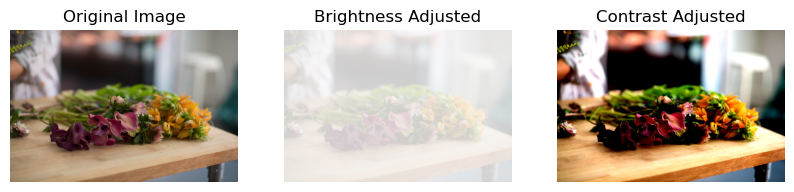

In [22]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def brightnessAdjust(img, p):
    """
    Adjusts the brightness of an image based on the parameter p.
    p=0 gives a black image, p=1 gives the original image, p=0.5 gives no adjustment.
    
    Args:
    - img: Input image as a NumPy array.
    - p: Brightness control parameter (0 to 1).
    
    Returns:
    - Adjusted image.
    """
    # Ensure the input parameter p is within [0, 1]
    p = np.clip(p, 0, 1)
    
    # Scale the image based on the brightness parameter

    if p <= 0.5:
        
        adjusted_img = img * (2*p)  # Simple linear interpolation
        print(p)

    elif p > 0.5:

        adjusted_img = img + (255-img)*(2*p-1)
    
    # Clip the values to stay within [0, 255] range
    adjusted_img = np.clip(adjusted_img, 0, 255).astype(np.uint8)
    
    return adjusted_img

def contrastAdjust(img, p):
    """
    Adjusts the contrast of an image based on the parameter p.
    p=0 gives a grey image, p=0.5 gives no adjustment, p=1 increases the contrast.
    
    Args:
    - img: Input image as a NumPy array.
    - p: Contrast control parameter (0 to 1).
    
    Returns:
    - Adjusted image.
    """
    # Ensure the input parameter p is within [0, 1]
    p = np.clip(p, 0, 1)
    
    # Define the midpoint for contrast adjustment (128 for 8-bit images)
    midpoint = 128.0
    
    # Slope for contrast adjustment, varies depending on p
    if p > 0.5:
        slope = 1 + 2 * (p - 0.5)  # Slope > 1 for p > 0.5 (increases contrast)
    else:
        slope = 1 - 2 * (0.5 - p)  # Slope < 1 for p < 0.5 (decreases contrast)
    
    # Adjust contrast: shift intensities towards or away from midpoint
    adjusted_img = midpoint + (img - midpoint) * slope
    
    # Clip the values to stay within [0, 255] range
    adjusted_img = np.clip(adjusted_img, 0, 255).astype(np.uint8)
    
    return adjusted_img

# Example usage:

# Load the image (you can replace 'brightness_contrast.jpg' with the actual image path)
img = cv2.imread('brightness_contrast.jpg')

# Convert the image from BGR to RGB for matplotlib display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply brightness adjustment
p_brightness = 0.9 # Example value for brightness
bright_img = brightnessAdjust(img_rgb, p_brightness)

# Apply contrast adjustment
p_contrast = 1  # Example value for contrast
contrast_img = contrastAdjust(img_rgb, p_contrast)

# Display results using matplotlib
plt.figure(figsize=(10, 5))

# Display original image
plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')

# Display brightness adjusted image
plt.subplot(1, 3, 2)
#plt.imshow(cv2.cvtColor(bright_img, cv2.COLOR_BGR2GRAY), cmap = 'gray')
plt.imshow(bright_img)
plt.title('Brightness Adjusted')
plt.axis('off')

# Display contrast adjusted image
plt.subplot(1, 3, 3)
plt.imshow(contrast_img,cmap='gray')
plt.title('Contrast Adjusted')
plt.axis('off')

# Show the images
plt.show()


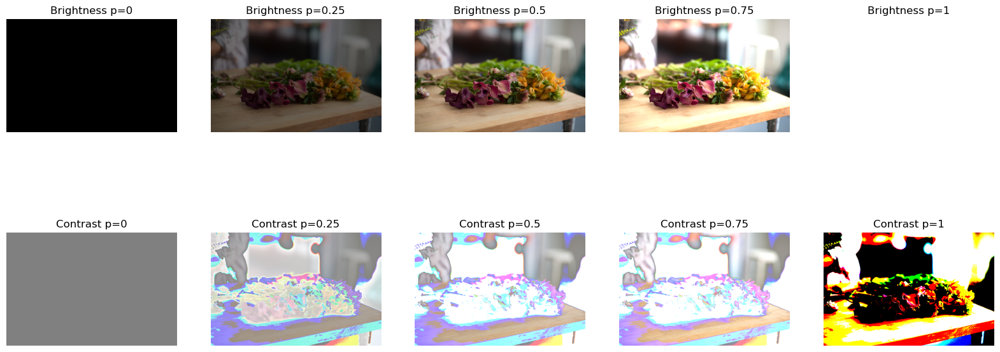

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def brightnessAdjust(img, p):
    if p < 0 or p > 1:
        raise ValueError("p should be between 0 and 1")
    
    if p == 0:
        return np.zeros_like(img)
    elif p == 1:
        return np.ones_like(img) * 255
    else:
        return np.clip(img * (2 * p), 0, 255).astype(np.uint8)

def contrastAdjust(img, p):
    if p < 0 or p > 1:
        raise ValueError("p should be between 0 and 1")
    
    if p == 0:
        return np.ones_like(img) * 128
    elif p == 1:
        return np.where(img > 128, 255, 0).astype(np.uint8)
    else:
        if p > 0.5:
            factor = 1 + (p - 0.5) * 2
        else:
            factor = p * 2
        mean = 128
        return np.clip((img - mean) * factor + mean, 0, 255).astype(np.uint8)

# Load the image
image = cv2.imread('brightness_contrast.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Test brightness adjustment
brightness_images = [brightnessAdjust(image, p) for p in [0, 0.25, 0.5, 0.75, 1]]

# Test contrast adjustment
contrast_images = [contrastAdjust(image, p) for p in [0, 0.25, 0.5, 0.75, 1]]

# Display the results
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, p in enumerate([0, 0.25, 0.5, 0.75, 1]):
    axes[0, i].imshow(brightness_images[i])
    axes[0, i].set_title(f'Brightness p={p}')
    axes[0, i].axis('off')

for i, p in enumerate([0, 0.25, 0.5, 0.75, 1]):
    axes[1, i].imshow(contrast_images[i])
    axes[1, i].set_title(f'Contrast p={p}')
    axes[1, i].axis('off')

plt.show()

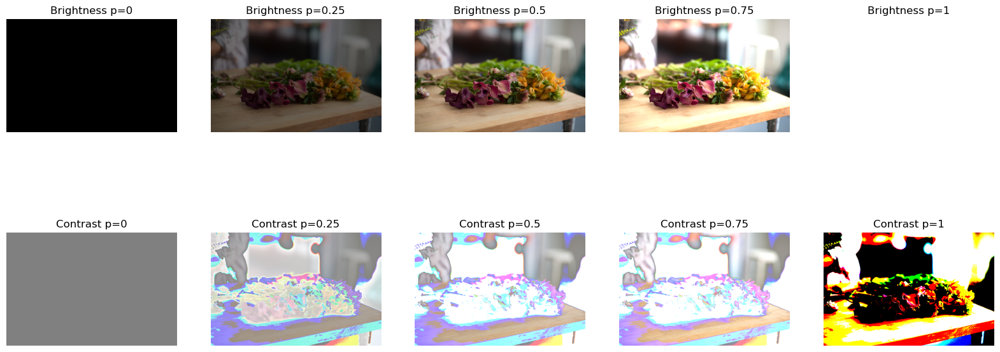

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def brightnessAdjust(img, p):
    if p < 0 or p > 1:
        raise ValueError("p should be between 0 and 1")
    
    if p == 0:
        return np.zeros_like(img)
    elif p == 1:
        return np.ones_like(img) * 255
    else:
        return np.clip(img * (2 * p), 0, 255).astype(np.uint8)

def contrastAdjust(img, p):
    if p < 0 or p > 1:
        raise ValueError("p should be between 0 and 1")
    
    if p == 0:
        return np.ones_like(img) * 128
    elif p == 1:
        return np.where(img > 128, 255, 0).astype(np.uint8)
    else:
        mean = 128
        if p > 0.5:
            factor = 1 + (p - 0.5) * 2
        else:
            factor = p * 2
        return np.clip((img - mean) * factor + mean, 0, 255).astype(np.uint8)

# Load the image
image = cv2.imread('brightness_contrast.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Test brightness adjustment
brightness_images = [brightnessAdjust(image, p) for p in [0, 0.25, 0.5, 0.75, 1]]

# Test contrast adjustment
contrast_images = [contrastAdjust(image, p) for p in [0, 0.25, 0.5, 0.75, 1]]

# Display the results
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, p in enumerate([0, 0.25, 0.5, 0.75, 1]):
    axes[0, i].imshow(brightness_images[i])
    axes[0, i].set_title(f'Brightness p={p}')
    axes[0, i].axis('off')

for i, p in enumerate([0, 0.25, 0.5, 0.75, 1]):
    axes[1, i].imshow(contrast_images[i])
    axes[1, i].set_title(f'Contrast p={p}')
    axes[1, i].axis('off')

plt.show()

In [42]:
import numpy as np

def contrast_adjust(img, p):
    """
    Adjust the contrast of the image based on parameter p.
    p=0: grey image
    p=1: binary image
    p=0.5: no change
    """
    # Ensure p is within the valid range
    p = np.clip(p, 0, 1)
    
    # Convert image to float to handle the calculations
    img_float = img.astype(np.float32)
    if p == 0:
        return np.ones_like(img) * 128
    elif p == 1:
        return np.where(img > 128, 255, 0).astype(np.uint8)
    mean = np.mean(img_float)
    if p >=0.5:
        # Contrast decreases from the original image to a grey image
        factor = 1+2*(p-0.5)
    else:
        # Contrast increases from the original image to a binary image
        factor = 2 * p 
        
    adjusted_img = np.clip(mean + factor * (img_float - mean),0, 255).astype(np.uint8)
    
    # Clip values to be in valid range [0, 255] and convert back to uint8
    adjusted_img = np.clip(adjusted_img, 0, 255).astype(np.uint8)
    
    return adjusted_img



In [35]:
import numpy as np

def brightness_adjust(img, p):
    """
    Adjust the brightness of the image based on the parameter p.
    
    Parameters:
    img (numpy.ndarray): Input image with pixel values in the range [0, 255].
    p (float): Parameter for brightness adjustment where 0 <= p <= 1.
    
    Returns:
    numpy.ndarray: Brightness-adjusted image.
    """
    if p < 0 or p > 1:
        raise ValueError("p should be between 0 and 1")
    
    # Create an empty image with the same shape as the input image
    adjusted_image = np.zeros_like(img, dtype=np.float32)
    
    # Perform brightness adjustment
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            for c in range(img.shape[2]):
                if p == 0:
                    adjusted_image[i, j, c] = 0
                elif p == 1:
                    adjusted_image[i, j, c] = 255
                else:
                    new_value = img[i, j, c] * (2 * p)
                    # Clip the value to be in the range [0, 255]
                    if new_value > 255:
                        new_value = 255
                    elif new_value < 0:
                        new_value = 0
                    adjusted_image[i, j, c] = new_value
    
    return adjusted_image.astype(np.uint8)


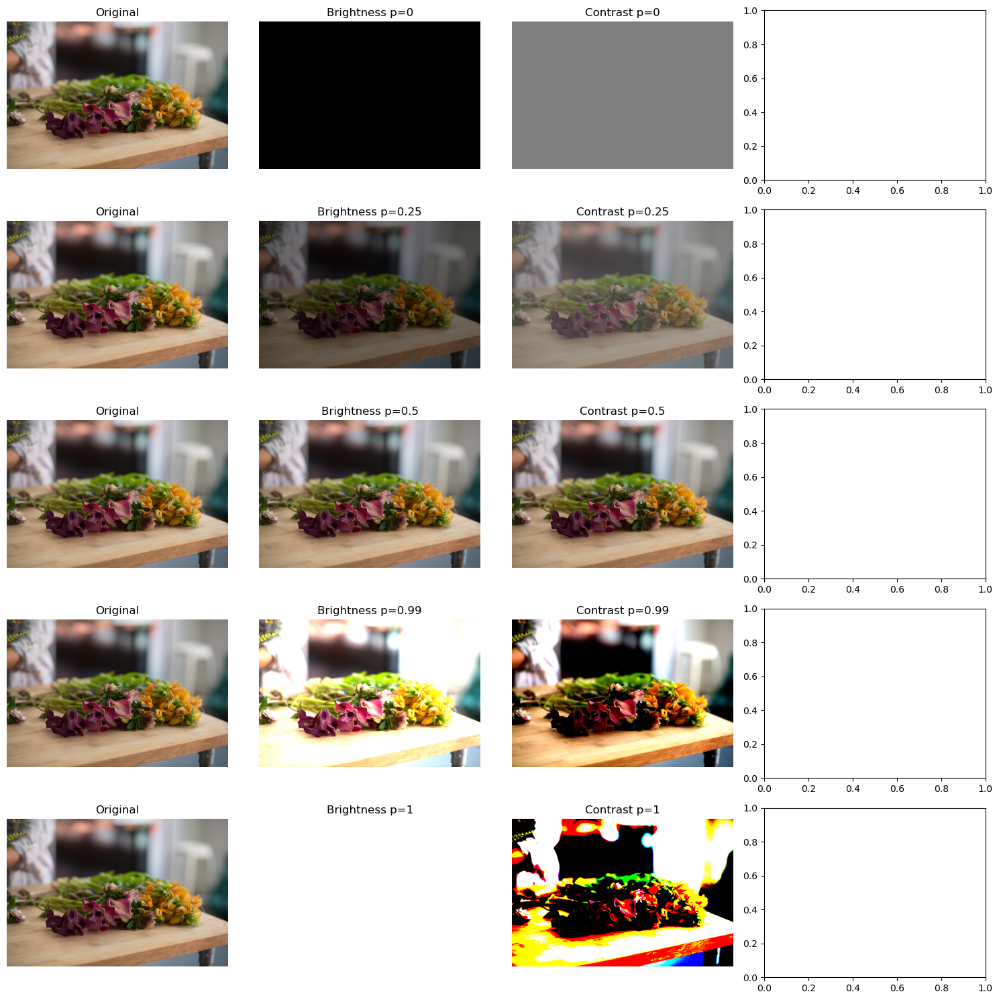

In [43]:
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('brightness_contrast.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply brightness and contrast adjustments
p_values = [0, 0.25, 0.5, 0.99, 1]
fig, axes = plt.subplots(len(p_values), 4, figsize=(15, 15))

for i, p in enumerate(p_values):
    # Brightness adjustment
    bright_img = brightness_adjust(image_rgb, p)
    
    # Contrast adjustment
    contrast_img = contrast_adjust(image_rgb, p)
    
    # Plot the results
    axes[i, 0].imshow(image_rgb)
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(bright_img)
    axes[i, 1].set_title(f'Brightness p={p}')
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(contrast_img)
    axes[i, 2].set_title(f'Contrast p={p}')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()
